#  Women in Data Science Kaggle Competition - Predicting Diabetes Mellitus

In [66]:
# Importing some cool stuf

import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

## Content
1. Overview
2. Import the datasets
3. Data cleaning
4. Exploratory Data Analysis
5. Modelling
6. Model evaluation

##  1. Overview

   Diabetes Mellitus is a chronic, metabolic disease characterized by high blood glucose levels over a prolonged period of time which leads over time to serious damage to the heart, blood vessels, eyes, kidneys and nerves. Diabetes is due to either the pancreas not producing enough insulin, or the cells of the body not responding properly to the insulin produced. There are 3 types of diabetes: Type 1, Type 2 and Gestational diabetes.
    According to the [World Health Organization](http://https://www.who.int/health-topics/diabetes#tab=tab_1), about 422 million people worldwide have diabetes, the majority living in low-and middle-income countries, and 1.6 million deaths are directly attributed to diabetes each year. The risk factors for diabetes are age over 45, BMI over 25, genetic factors, high blood pressure and high cholesterol among others.
    This year's competition focuses on predicting diabetes mellitus. It's critical for doctors to be aware of chronic co-morbidities in order to treat patients appropriately, however, this information isn't always available, since patients can be admitted to a hospital unconscious or without a complete medical history.
    The challenge consists in predict diabetes based on data collected during the first 24 hours of admission to an intensive care unit, using best machine learning tools we have at our disposal.
    More details [here](https://www.kaggle.com/c/widsdatathon2021/overview)

## 2. Import the datasets

In [67]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/widsdatathon2021/SampleSubmissionWiDS2021.csv
/kaggle/input/widsdatathon2021/SolutionTemplateWiDS2021.csv
/kaggle/input/widsdatathon2021/DataDictionaryWiDS2021.csv
/kaggle/input/widsdatathon2021/UnlabeledWiDS2021.csv
/kaggle/input/widsdatathon2021/TrainingWiDS2021.csv


In [68]:
train_df = pd.read_csv ( "../input/widsdatathon2021/TrainingWiDS2021.csv")
test_df = pd.read_csv("../input/widsdatathon2021/UnlabeledWiDS2021.csv")
data_dict = pd.read_csv ( "../input/widsdatathon2021/DataDictionaryWiDS2021.csv")

In [69]:
#check the size of train_df and test_df
print(train_df.shape)
print(test_df.shape)

(130157, 181)
(10234, 180)


In [70]:
#let's see the first 5 rows of train_df
train_df.head()

,Unnamed: 0,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,...,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
0,1,214826,118,68.0,22.732803,0,Caucasian,M,180.3,Floor,...,NaN,NaN,0,0,0,0,0,0,0,1
1,2,246060,81,77.0,27.421875,0,Caucasian,F,160.0,Floor,...,51.0,51.0,0,0,0,0,0,0,0,1
2,3,276985,118,25.0,31.952749,0,Caucasian,F,172.7,Emergency Department,...,NaN,NaN,0,0,0,0,0,0,0,0
3,4,262220,118,81.0,22.635548,1,Caucasian,F,165.1,Operating Room,...,337.0,337.0,0,0,0,0,0,0,0,0
4,5,201746,33,19.0,NaN,0,Caucasian,M,188.0,NaN,...,NaN,NaN,0,0,0,0,0,0,0,0


In [71]:
#let's see the first 5 rows of test_df
test_df.head()

,Unnamed: 0,encounter_id,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,...,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
0,1,144740,10141,72,NaN,0,Caucasian,F,152.4,Floor,...,NaN,NaN,NaN,0,0,0,0,0,0,0
1,2,141990,10141,86,NaN,0,Caucasian,F,175.3,Emergency Department,...,NaN,NaN,NaN,0,0,0,0,0,0,0
2,3,142038,10141,72,NaN,0,Caucasian,F,162.6,Floor,...,NaN,NaN,NaN,0,0,0,0,0,0,0
3,4,138628,10141,66,NaN,0,Caucasian,M,177.8,Floor,...,NaN,NaN,NaN,0,0,0,0,0,0,0
4,5,141682,10141,89,NaN,0,Caucasian,M,170.2,Direct Admit,...,NaN,NaN,NaN,0,0,0,0,0,0,0


In [72]:
#describing the data
train_df.describe()

,Unnamed: 0,encounter_id,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,readmission_status,...,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
count,130157.000000,130157.000000,130157.000000,125169.000000,125667.000000,130157.000000,128080.000000,130157.000000,130157.000000,130157.0,...,16760.000000,16760.000000,130157.00000,130157.000000,130157.000000,130157.000000,130157.000000,130157.000000,130157.000000,130157.000000
mean,65079.000000,213000.856519,106.102131,61.995103,29.110260,0.189840,169.607219,662.428344,0.839933,0.0,...,247.525419,239.617358,0.00103,0.016081,0.013599,0.025669,0.007307,0.004187,0.020852,0.216285
std,37573.233831,38109.828146,63.482277,16.822880,8.262776,0.392176,10.833085,304.259843,2.485337,0.0,...,131.440167,128.562211,0.03207,0.125786,0.115819,0.158146,0.085166,0.064574,0.142888,0.411712
min,1.000000,147000.000000,1.000000,0.000000,14.844926,0.000000,137.200000,82.000000,-0.250000,0.0,...,42.000000,38.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32540.000000,180001.000000,49.000000,52.000000,23.598006,0.000000,162.500000,427.000000,0.045833,0.0,...,144.000000,138.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,65079.000000,213014.000000,112.000000,64.000000,27.564749,0.000000,170.100000,653.000000,0.155556,0.0,...,228.125000,218.750000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,97618.000000,246002.000000,165.000000,75.000000,32.803127,0.000000,177.800000,969.000000,0.423611,0.0,...,333.000000,324.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,130157.000000,279000.000000,204.000000,89.000000,67.814990,1.000000,195.590000,1111.000000,175.627778,0.0,...,720.000000,654.813793,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [73]:
test_df.describe()

,Unnamed: 0,encounter_id,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,readmission_status,...,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
count,10234.000000,10234.000000,10234.000000,10234.000000,9219.000000,10234.000000,9933.000000,10234.000000,10234.000000,10234.0,...,1928.000000,1422.000000,1422.000000,10234.000000,10234.000000,10234.000000,10234.000000,10234.000000,10234.000000,10234.000000
mean,5117.500000,140498.779461,10092.391929,62.853625,29.116463,0.200117,169.276414,677.823725,0.831339,0.0,...,156.767998,254.687589,246.255826,0.000977,0.012019,0.010064,0.022572,0.006547,0.004104,0.017686
std,2954.445661,3182.455522,57.008062,17.851661,8.342873,0.400107,10.805701,304.116531,2.411936,0.0,...,105.623078,132.087636,130.745488,0.031245,0.108975,0.099821,0.148541,0.080651,0.063934,0.131814
min,1.000000,135000.000000,10001.000000,18.000000,14.900000,0.000000,137.000000,82.000000,-0.208333,0.0,...,30.000000,42.620000,41.417000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2559.250000,137742.250000,10043.000000,52.000000,23.700000,0.000000,162.500000,451.000000,0.032639,0.0,...,79.000000,151.400000,144.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5117.500000,140503.500000,10085.000000,65.000000,27.600000,0.000000,170.000000,687.000000,0.134028,0.0,...,118.000000,234.000000,224.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,7675.750000,143252.750000,10145.000000,76.000000,32.600000,0.000000,177.800000,962.000000,0.430382,0.0,...,206.075000,345.525000,336.525000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,10234.000000,146000.000000,10199.000000,96.000000,69.944000,1.000000,195.600000,1111.000000,65.945833,0.0,...,518.060000,672.824000,651.656000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## 3. Data cleaning

Right now, we focus on the data the way it is. We need to search for missing data and treat them accordingly

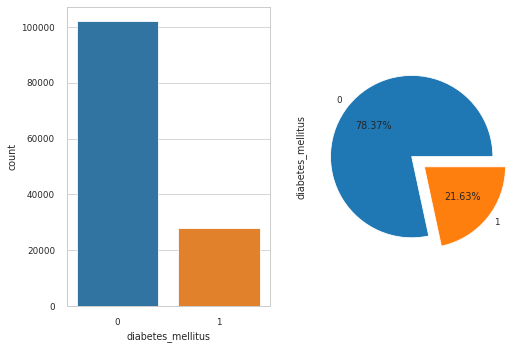

In [74]:
#Let's take a look at the target column ('diabetes mellitus')

fig, ax =plt.subplots(1,2)
sns.set_style("whitegrid")
sns.set_context("paper")
sns.countplot(x = 'diabetes_mellitus',data=train_df, ax=ax[0])
train_df['diabetes_mellitus'].value_counts().plot.pie(explode=[0,0.2],autopct='%1.2f%%',ax=ax[1])
fig.show()

#Note that it's an imbalanced dataset as the number of patients without diabetes is larger

What if I told you there's a dope and fast way to check your data? It's Pandas Profiling! Let's check it out

In [75]:
train_profile = ProfileReport(train_df, 'EDA')

In [76]:
train_profile

Summarize dataset:   0%|          | 0/190 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [77]:
test_profile = ProfileReport(test_df, 'EDA')
test_profile

Summarize dataset:   0%|          | 0/189 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Ok, now we have a considerable amount of information to perform data cleaning. Here's a list of our findings so far:

* The data is imbalanced
* All these features have > 70% of missing values, in train_df, we should consider drop them: fio2_apache, paco2_apache, paco2_for_ph_apache, pao2_apache, ph_apache, d1_diasbp_invasive_max, d1_diasbp_invasive_min, d1_mbp_invasive_max, d1_mbp_invasive_min, d1_sysbp_invasive_max, d1_sysbp_invasive_min, h1_diasbp_invasive_max, h1_diasbp_invasive_min, h1_mbp_invasive_max, h1_mbp_invasive_min, h1_sysbp_invasive_max, h1_sysbp_invasive_min, d1_lactate_max, d1_lactate_min, h1_albumin_max, h1_albumin_min, h1_bilirubin_max, h1_bilirubin_min, h1_bun_max, h1_bun_min, h1_calcium_max, h1_calcium_min, h1_creatinine_max, h1_creatinine_min, h1_hco3_max, h1_hco3_min, h1_hemaglobin_max, h1_hemaglobin_min, h1_hematocrit_max, h1_hematocrit_min, h1_lactate_max, h1_lactate_min, h1_platelets_max, h1_platelets_min, h1_potassium_max, h1_potassium_min, h1_sodium_max, h1_sodium_min, h1_wbc_max, h1_wbc_min, d1_pao2fio2ratio_max, d1_pao2fio2ratio_min, h1_arterial_pco2_max, h1_arterial_pco2_min, h1_arterial_ph_max, h1_arterial_ph_min, h1_arterial_po2_max, h1_arterial_po2_min, h1_pao2fio2ratio_max, h1_pao2fio2ratio_min.
* Some of the patients have implausible age (age = 0), maybe we should remove them
* Other features like weight, height, gender, bmi, etc. must have their missing values filled appropriately.



Let's drop identifiers columns (hospital_id, encounter_id, icu_id) and the 'Unnamed: 0', since intuitively they're useless to predict patient's diabetes. Also we drop 'readmission_status' because it only has one unique value of 0, in both train and test dataframes

In [78]:
test_encounter_ids = test_df['encounter_id']
cols_to_drop = ['hospital_id', 'icu_id', 'Unnamed: 0', 'encounter_id', 'readmission_status']
train_df.drop(cols_to_drop, axis=1, inplace=True)
test_df.drop(cols_to_drop, axis=1, inplace=True)

There are some features related to vital signs and hemogram in the in the dataset. They are measured at the first hour (h1) and at the first day (d1) of hospitalization, and they're displayed as min and max values. As we discovered in pandas profiling, most of them have a lot of missing values. For sake of simplification, we're going to drop all the columns with h1 measurements and some others that we identified as having more than 70% of missing values. 

In [79]:
drop_columns = train_df.columns[train_df.columns.str.startswith('h1')]
train_df.drop(drop_columns, axis=1, inplace=True)
test_df.drop(drop_columns, axis=1, inplace=True)

In [80]:
# columns with > 70% of missing values:
cols_to_drop = ['fio2_apache', 'paco2_apache', 'paco2_for_ph_apache', 'pao2_apache', 'ph_apache', 'd1_diasbp_invasive_max',
                'd1_diasbp_invasive_min', 'd1_mbp_invasive_max', 'd1_mbp_invasive_min', 'd1_sysbp_invasive_max', 
                'd1_sysbp_invasive_min', 'd1_lactate_max', 'd1_lactate_min', 'd1_pao2fio2ratio_max', 'd1_pao2fio2ratio_min']
train_df.drop(cols_to_drop, axis=1, inplace=True)
test_df.drop(cols_to_drop, axis=1, inplace=True)

We have very few missing values of 'gender' (0.1%), so it's ok to fill this values with the mode, which is the value that appears the most

In [81]:
train_df['gender'] = train_df['gender'].fillna(train_df['gender'].mode()[0])
#note that there's no missing 'gender' in test_df

'ethnicity' has 1.2% of missing values in train_df and 2% in test_df, so let's fill those with 'Other'

In [82]:
train_df['ethnicity'] = train_df['ethnicity'].fillna('Other')
test_df['ethnicity'] = test_df['ethnicity'].fillna('Other')

Filling the 'age' missing values with the mode in train_df (fortunately there's none in test_df):

In [83]:
train_df['age'] = train_df['age'].fillna(train_df['age'].mode()[0])

There are 30 entries with age = 0 in train df (none in test_df), we have to drop them.

In [84]:
train_df = train_df[train_df['age'] > 0]

Another important feature to determine diabetes is bmi, which is calculated by bmi = weight/height^2. Following the idea in [this notebook](https://www.kaggle.com/miios18/wids-2021-diabetes-prediction), I'm going to fill the missing data in weight and height with the mean by gender and then fill in the missing values of bmi by the equation.

<AxesSubplot:xlabel='height', ylabel='Count'>

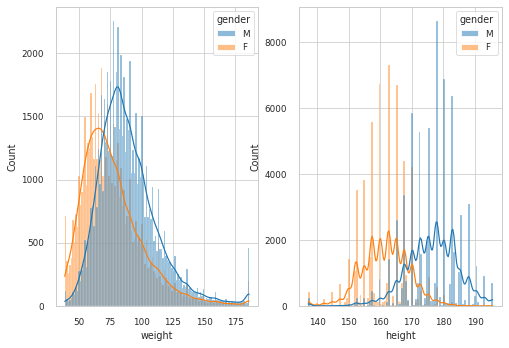

In [85]:
# distribution of weight and height by gender
fig, ax = plt.subplots(1,2)
sns.set_style("whitegrid")
sns.histplot(train_df, x = 'weight', hue = 'gender', kde = True, ax=ax[0])
sns.histplot(train_df, x = 'height', hue = 'gender', kde = True, ax=ax[1])

As we expected, men tend to be heavier and taller than women. Let's check the mean value for both groups

In [86]:
display(train_df.groupby('gender')[['weight', 'height']].mean())
display(test_df.groupby('gender')[['weight', 'height']].mean())

,weight,height
gender,,
F,77.042423,161.631204
M,89.483324,176.338629


,weight,height
gender,,
F,77.112713,161.534660
M,88.836120,175.836729


In [87]:
# filling the NAN values from 'weight' and 'height'
train_df["height"] = np.where((train_df.height.isna() & (train_df.gender == 'F')), 
                              162, train_df["height"])
train_df["height"] = np.where((train_df.height.isna() & (train_df.gender == 'M')), 
                              176, train_df["height"])
train_df["weight"] = np.where((train_df.height.isna() & (train_df.gender == 'F')), 
                              77, train_df["weight"])
train_df["weight"] = np.where((train_df.height.isna() & (train_df.gender == 'M')), 
                              89, train_df["weight"])

test_df["height"] = np.where((test_df.height.isna() & (test_df.gender == 'F')), 
                             162, test_df["height"])
test_df["height"] = np.where((test_df.height.isna() & (test_df.gender == 'M')), 
                             176, test_df["height"])
test_df["weight"] = np.where((test_df.height.isna() & (test_df.gender == 'F')), 
                             78, test_df["weight"])
test_df["weight"] = np.where((test_df.height.isna() & (test_df.gender == 'M')), 
                             89, test_df["weight"])

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inst

In [88]:
# filling NAN in bmi
train_df['bmi'] = np.where(train_df['bmi'].isna(), train_df['weight']/ (train_df['height']/100)**2, train_df['bmi'])
test_df['bmi'] = np.where(test_df['bmi'].isna(), test_df['weight']/ (test_df['height']/100)**2, test_df['bmi'])

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


We need to perform feature engineering. Let's categorize bmi and age.

Categorize bmi values:
* <18.5: underweight
* 18.5 to <25: normal
* 25 to <30: overweight
* 30 to <35: obese class 1
* 35 to <40: obese class 2
* Higher than 40: obese class 3

In [89]:
def categorize_bmi(x):
    if pd.isna(x):
        return np.nan
    if x < 15: 
        return 0 
    elif x >= 15 and x < 16: 
        return 1
    elif x >= 16 and x < 18.5:
        return 2
    elif 18.5 <= x and x < 25:
        return 3
    elif 25 <= x and x < 30:
        return 4
    elif 30 <= x and x < 35:
        return 5
    elif 35 <= x:
        return 
def categorize_age(x):
    if x < 50: 
        return 1
    elif x >= 50 and x < 65:
        return 2
    elif x >= 65 and x < 75:
        return 3
    elif x >= 75:
        return 4

rounding age, heigh, weight and bmi.

In [90]:
train_df['age'] = train_df['age'].fillna(0).apply(lambda x: round(x,-1)).astype(int)

# round range of 5
train_df['height'] = train_df['height'].fillna(0).apply(lambda x: 5 * (round(x/5))).astype(int)
train_df['weight'] = train_df['weight'].fillna(0).apply(lambda x: 5 * (round(x/5))).astype(int)
train_df['bmi'] = train_df['bmi'].fillna(0).apply(lambda x: 5 * (round(x/5))).astype(int)

test_df['age'] = test_df['age'].fillna(0).apply(lambda x: round(x,-1)).astype(int)

# round range of 5
test_df['height'] = test_df['height'].fillna(0).apply(lambda x: 5 * (round(x/5))).astype(int)
test_df['weight'] = test_df['weight'].fillna(0).apply(lambda x: 5 * (round(x/5))).astype(int)
test_df['bmi'] = test_df['bmi'].fillna(0).apply(lambda x: 5 * (round(x/5))).astype(int)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

In [91]:
train_df.insert(4, 'cat_bmi', train_df['bmi'].apply(lambda x: categorize_bmi(x)))
test_df.insert(4, 'cat_bmi', test_df['bmi'].apply(lambda x: categorize_bmi(x)))

In [92]:
train_df.insert(3, 'cat_age', train_df['age'].apply(lambda x: categorize_age(x)))   
test_df.insert(3, 'cat_age', test_df['age'].apply(lambda x: categorize_age(x)))  

Ok, it's time to see how our data cleaning is going after all this.

In [93]:
# check null values
train_df.isnull().sum().sort_values(ascending=False)

d1_arterial_ph_max      84779
d1_arterial_ph_min      84779
d1_arterial_pco2_min    84433
d1_arterial_pco2_max    84433
d1_arterial_po2_max     83982
                        ...  
gender                      0
ethnicity                   0
cat_age                     0
elective_surgery            0
diabetes_mellitus           0
Length: 99, dtype: int64

In [94]:
test_df.isnull().sum().sort_values(ascending=False)

d1_arterial_ph_max             6485
d1_arterial_ph_min             6485
d1_arterial_pco2_min           6411
d1_arterial_pco2_max           6411
d1_arterial_po2_min            6342
                               ... 
height                            0
ethnicity                         0
cat_age                           0
elective_surgery                  0
solid_tumor_with_metastasis       0
Length: 98, dtype: int64

Good thing: the columns in which we worked on, for instance, height, ethnicity and gender, have no missing values anymore. Bad thing: we still have A LOT of missing values in other columns. From now on, we're going to replace the null values with the mean for numerical featurings and with the mode for categorical features (adapted from [this notebook](https://www.kaggle.com/vaishnavipatil4848/wids-datathon-2021-diabetes-analysis)).

In [95]:
#removing missing values from numerical features
for col in train_df.columns:
    if train_df[col].dtype == 'int' or train_df[col].dtype == 'float':
        train_df[col] = train_df[col].fillna(train_df[col].mean())
for col in test_df.columns:
    if test_df[col].dtype == 'int' or test_df[col].dtype == 'float':
        test_df[col] = test_df[col].fillna(test_df[col].mean())

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [96]:
#removing missing values from categorical features
for col in train_df.columns:
    if train_df[col].dtype == 'object':
        train_df[col] = train_df[col].fillna(train_df[col].mode()[0])
for col in test_df.columns:
    if test_df[col].dtype == 'object':
        test_df[col] = test_df[col].fillna(test_df[col].mode()[0])

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


Let's check the datasets one more time:

In [97]:
train_df.isnull().sum().sort_values(ascending=False)

age                  0
d1_hematocrit_min    0
d1_hemaglobin_min    0
d1_hemaglobin_max    0
d1_hco3_min          0
                    ..
map_apache           0
intubated_apache     0
hematocrit_apache    0
heart_rate_apache    0
diabetes_mellitus    0
Length: 99, dtype: int64

In [98]:
test_df.isnull().sum().sort_values(ascending=False)

age                            0
d1_hematocrit_max              0
d1_hemaglobin_max              0
d1_hco3_min                    0
d1_hco3_max                    0
                              ..
map_apache                     0
intubated_apache               0
hematocrit_apache              0
heart_rate_apache              0
solid_tumor_with_metastasis    0
Length: 98, dtype: int64

No missing values, great work!

Remember: We're dealing with imbalanced data, so we're going to make undersampling, a process where you randomly delete some of the observations from the majority class in order to match the numbers with the minority class. 
As noticed in pandas profile, our target column has 102006 (78,4%) 0 values and 28151 (21,6%) 1 values, let's randomly drop rows of the dataset to balance it, this way our model won't be biased.

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


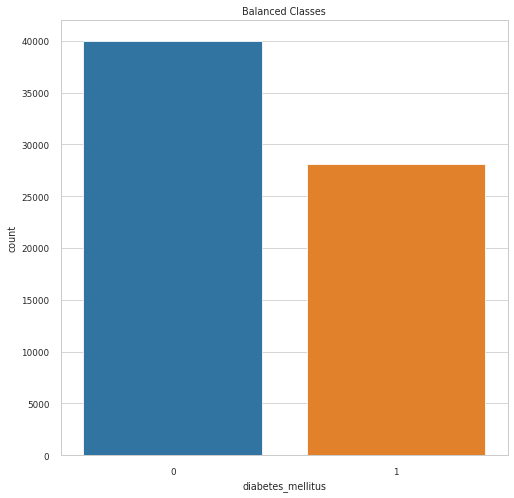

In [99]:
# adapted from https://towardsdatascience.com/having-an-imbalanced-dataset-here-is-how-you-can-solve-it-1640568947eb

# Shuffle the Dataset.
shuffled_df = train_df.sample(frac=1,random_state=4)

# Put all the diabetes class in a separate dataset.
diabetes_df = shuffled_df.loc[shuffled_df['diabetes_mellitus'] == 1]

#Randomly select 40000 observations from the non-diabetes (majority class)
#I chose 40000 observations in order to maintain an expressive amount of training data and decrease the difference between the two classes 
non_diabetes_df = shuffled_df.loc[shuffled_df['diabetes_mellitus'] == 0].sample(n=40000,random_state=42)

# Concatenate both dataframes again
normalized_train_df = pd.concat([diabetes_df, non_diabetes_df])

#plot the dataset after the undersampling
plt.figure(figsize=(8, 8))
sns.countplot('diabetes_mellitus', data=normalized_train_df)
plt.title('Balanced Classes')
plt.show()

Seems better now! From now on, we're using "normalizad_train_df" as our new train_df

We have performed very simple data cleaning. I found [this notebook](https://www.kaggle.com/parulpandey/a-guide-to-handling-missing-values-in-python) super useful in case you wish to dig deeper on that matter.

## 4. Exploratory Data Analysis

In [100]:
normalized_train_df.describe()

,age,bmi,elective_surgery,cat_age,cat_bmi,height,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,...,d1_arterial_po2_max,d1_arterial_po2_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
count,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000,...,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000,68148.000000
mean,62.961936,29.015745,0.188707,2.613518,3.889458,170.206169,0.871297,83.496654,2.883018,185.471659,...,164.150836,102.467405,0.000910,0.016904,0.014072,0.025254,0.007102,0.003962,0.020015,0.413042
std,16.341295,9.817069,0.391279,1.015044,0.993059,11.267399,2.550672,28.699381,0.431196,85.744660,...,63.046127,36.216952,0.030149,0.128914,0.117790,0.156896,0.083975,0.062820,0.140053,0.492384
min,20.000000,0.000000,0.000000,1.000000,0.000000,135.000000,-0.250000,0.000000,1.200000,101.000000,...,39.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50.000000,25.000000,0.000000,2.000000,3.861715,160.000000,0.046528,65.000000,2.886149,113.000000,...,165.005635,102.957864,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,70.000000,30.000000,0.000000,3.000000,4.000000,170.000000,0.159028,80.000000,2.886149,123.000000,...,165.005635,102.957864,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,80.000000,35.000000,0.000000,4.000000,4.000000,180.000000,0.436806,100.000000,2.886149,301.000000,...,165.005635,102.957864,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,90.000000,70.000000,1.000000,4.000000,5.000000,195.000000,159.090972,185.000000,4.600000,308.000000,...,540.865000,448.892000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [101]:
normalized_train_df.info(null_counts = True, verbose = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68148 entries, 89844 to 101371
Data columns (total 99 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   age                          68148 non-null  int64  
 1   bmi                          68148 non-null  int64  
 2   elective_surgery             68148 non-null  int64  
 3   cat_age                      68148 non-null  int64  
 4   ethnicity                    68148 non-null  object 
 5   cat_bmi                      68148 non-null  float64
 6   gender                       68148 non-null  object 
 7   height                       68148 non-null  int64  
 8   hospital_admit_source        68148 non-null  object 
 9   icu_admit_source             68148 non-null  object 
 10  icu_stay_type                68148 non-null  object 
 11  icu_type                     68148 non-null  object 
 12  pre_icu_los_days             68148 non-null  float64
 13  weight     

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  """Entry point for launching an IPython kernel.


In [102]:
# let's look at the categorical features of our dataset!
#list of categorical columns:

categorical_feature = [f for f in normalized_train_df.columns if train_df[f].dtypes == 'O']
print(categorical_feature)

['ethnicity', 'gender', 'hospital_admit_source', 'icu_admit_source', 'icu_stay_type', 'icu_type']


In [103]:
#plotting the categorical features versus the target column:

def create_countplot(x):
    plt.figure(figsize=(8,6))
    sns.set_style("whitegrid")
    sns.set_context("paper")
    g = sns.countplot(x = x, data = normalized_train_df, hue = 'diabetes_mellitus')
    plt.xticks(rotation = 90)

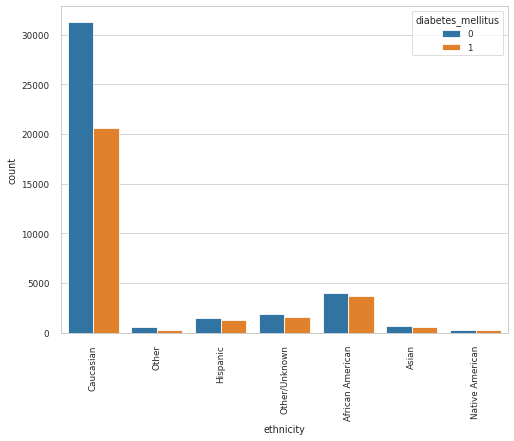

In [104]:
create_countplot('ethnicity')

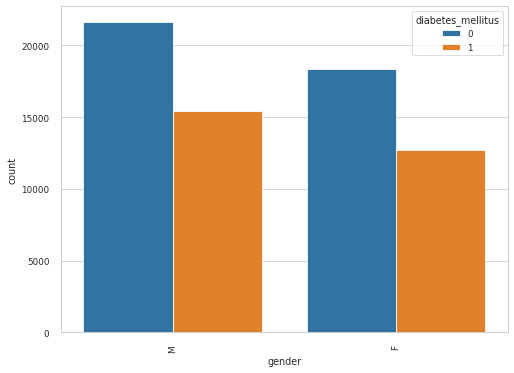

In [105]:
create_countplot('gender')

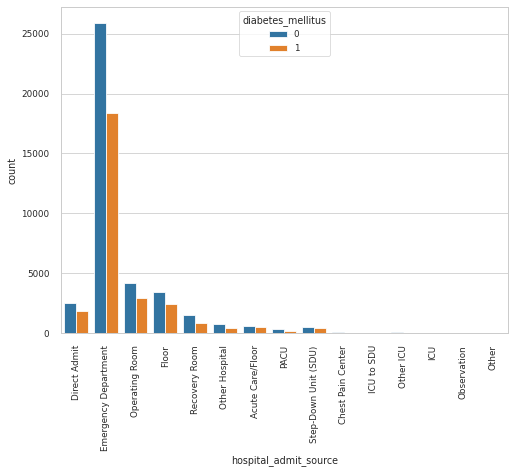

In [106]:
create_countplot('hospital_admit_source')

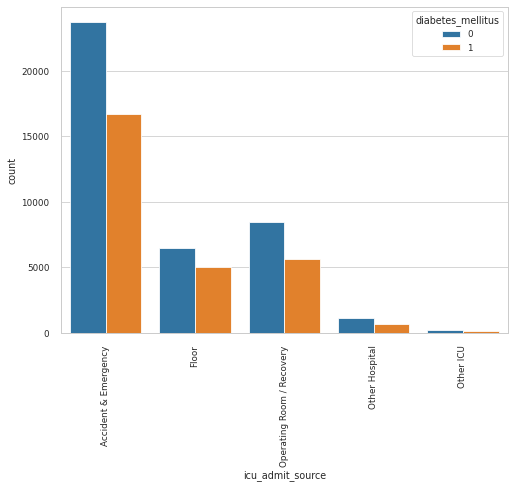

In [107]:
create_countplot('icu_admit_source')

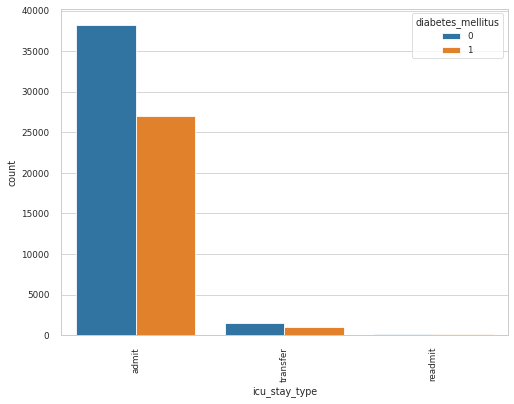

In [108]:
create_countplot('icu_stay_type')

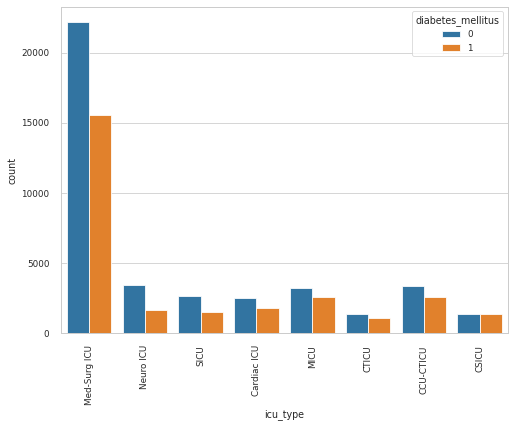

In [109]:
create_countplot('icu_type')

In [110]:
# Now, let's look at some numerical features versus our target column ('diabetes_mellitus')

def create_histogram(x):
    plt.figure(figsize=(6,6))
    sns.set_style("whitegrid")
    sns.set_context("paper")
    sns.histplot(normalized_train_df, x = x, hue = 'diabetes_mellitus', kde = True, bins = 25, ax=axes[0])
    
def create_boxplot(y):
    plt.figure(figsize=(6,6))
    sns.set_style("whitegrid")
    sns.set_context("paper")
    g = sns.boxplot(x = 'diabetes_mellitus', y = y, data = normalized_train_df, ax=axes[1])
    medians = normalized_train_df.groupby(['diabetes_mellitus'])[y].median()
    vertical_offset = normalized_train_df[y].median() * 0.05 # offset from median for display

    for xtick in g.get_xticks():
        g.text(xtick,medians[xtick] + vertical_offset,medians[xtick],horizontalalignment='center',size='medium',color='w',weight='semibold')

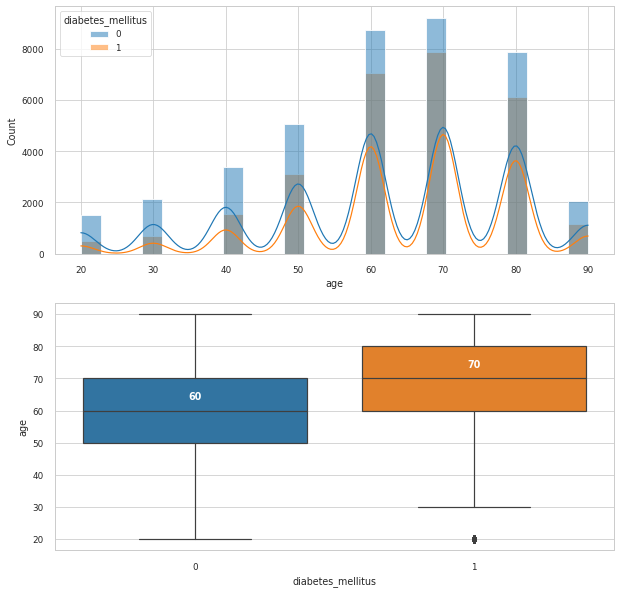

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

In [111]:
#age versus diabetes
fig, axes = plt.subplots(2, 1, figsize=(10, 10))
create_histogram('age')
create_boxplot('age')

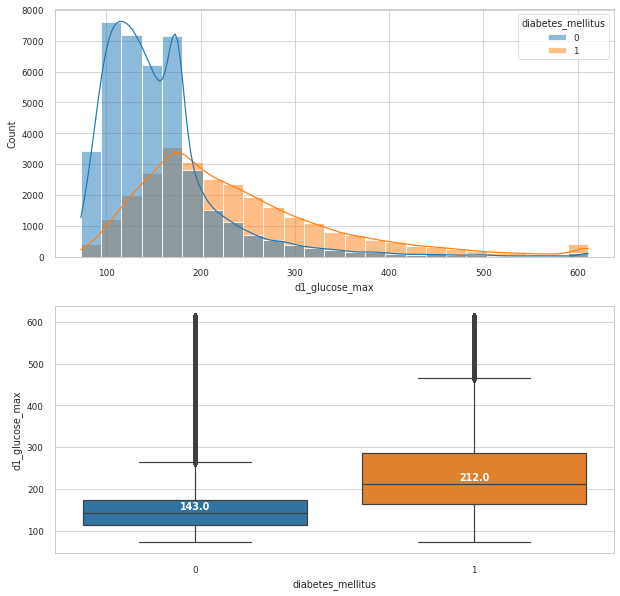

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

In [112]:
#Max glucose versus diabetes
fig, axes = plt.subplots(2, 1, figsize=(10, 10))
create_histogram('d1_glucose_max')
create_boxplot('d1_glucose_max')

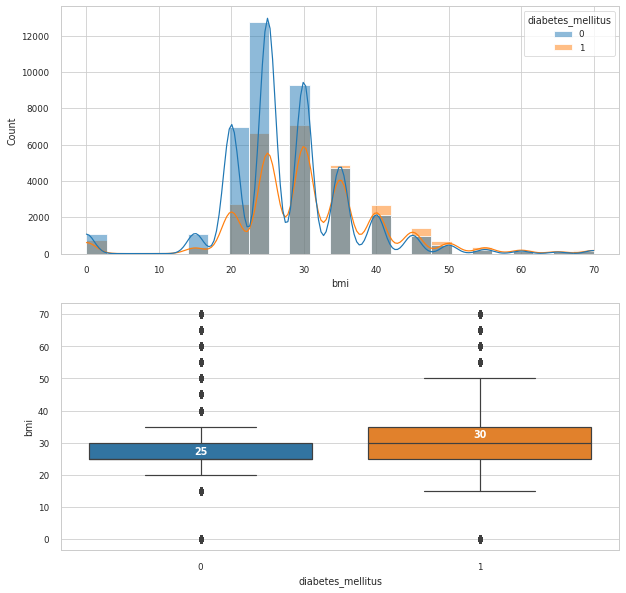

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

In [113]:
#BMI versus diabetes
fig, axes = plt.subplots(2, 1, figsize=(10, 10))
create_histogram('bmi')
create_boxplot('bmi')

#note that bmi > 30 is equivalent to obese

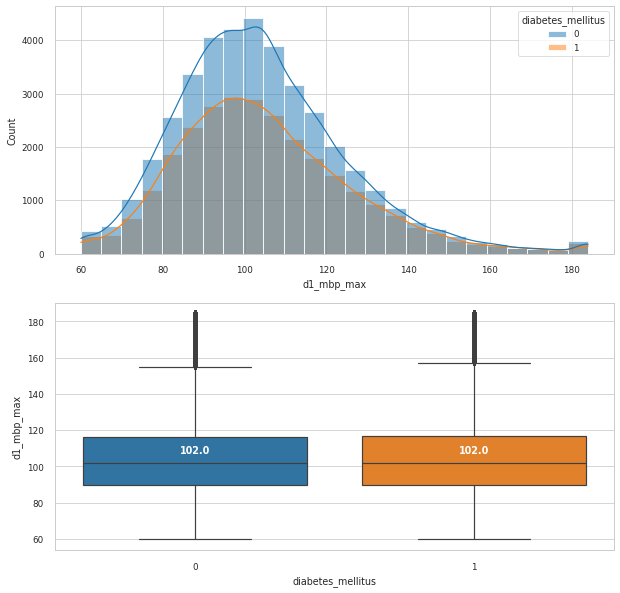

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

In [114]:
# Patient's highest mean blood pressure during the first 24 hours of their unit stay versus diabetes
fig, axes = plt.subplots(2, 1, figsize=(10,10))
create_histogram('d1_mbp_max')
create_boxplot('d1_mbp_max')

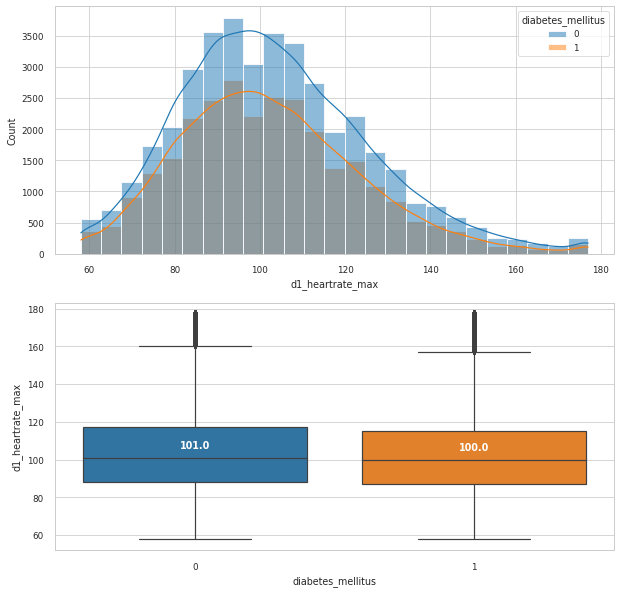

<Figure size 432x432 with 0 Axes>

<Figure size 432x432 with 0 Axes>

In [115]:
# patient's highest heart rate during the first 24 hours of their unit stay versus diabetes
fig, axes = plt.subplots(2, 1, figsize=(10, 10))
create_histogram('d1_heartrate_max')
create_boxplot('d1_heartrate_max')

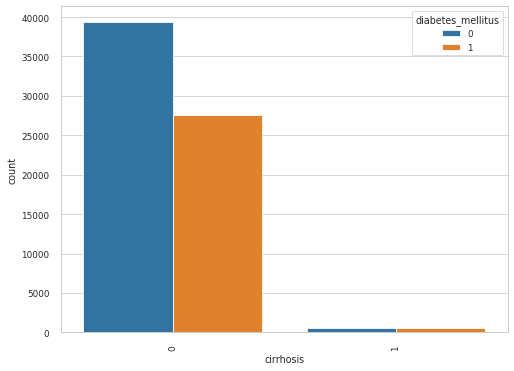

In [116]:
#It's known that diabetes can lead to problems in several organs, so it is worth it to see the behavior of cirrhosis and hepatic_failure

create_countplot('cirrhosis')

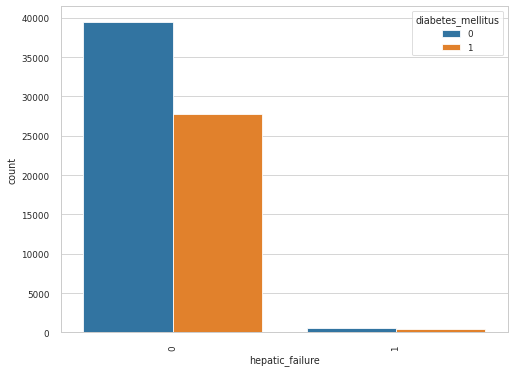

In [117]:
create_countplot('hepatic_failure')

It seems like in our dataset, these comorbities are not very representative.

## 5. Modelling

In [118]:
#Using get_dummies for categorical variables of interest encoding
#first, keeping a train and test data frame for future reference
ref_train_df = normalized_train_df.copy()
ref_test_df = test_df.copy()

In [119]:
np.unique(ref_train_df['hospital_admit_source'])

array(['Acute Care/Floor', 'Chest Pain Center', 'Direct Admit',
       'Emergency Department', 'Floor', 'ICU', 'ICU to SDU',
       'Observation', 'Operating Room', 'Other', 'Other Hospital',
       'Other ICU', 'PACU', 'Recovery Room', 'Step-Down Unit (SDU)'],
      dtype=object)

In [120]:
np.unique(ref_test_df['hospital_admit_source'])

array(['Chest Pain Center', 'Direct Admit', 'Emergency Department',
       'Floor', 'ICU to SDU', 'Operating Room', 'Other Hospital',
       'Other ICU', 'Recovery Room', 'Step-Down Unit (SDU)'], dtype=object)

In [121]:
train_df = ref_train_df.copy()
test_df = ref_test_df.copy()

train_df.drop('hospital_admit_source', axis = 1, inplace = True)
test_df.drop('hospital_admit_source', axis = 1, inplace = True)

train_df = pd.concat([train_df.drop('ethnicity', axis = 1), pd.get_dummies(train_df['ethnicity'], prefix = 'ethnicity')], axis = 1)
test_df = pd.concat([test_df.drop('ethnicity', axis = 1), pd.get_dummies(test_df['ethnicity'], prefix = 'ethnicity')], axis = 1) 

# train_df = pd.concat([
#                     train_df.drop('hospital_admit_source', axis = 1),
#                     pd.get_dummies(train_df['hospital_admit_source'], prefix = 'has')],
#                     axis = 1)
# test_df = pd.concat([
#                     test_df.drop('hospital_admit_source', axis = 1),
#                     pd.get_dummies(test_df['hospital_admit_source'], prefix = 'has')],
#                     axis = 1)

train_df = pd.concat([
                    train_df.drop('icu_admit_source', axis = 1),
                    pd.get_dummies(train_df['icu_admit_source'], prefix = 'ias')],
                    axis = 1)
test_df = pd.concat([
                    test_df.drop('icu_admit_source', axis = 1),
                    pd.get_dummies(test_df['icu_admit_source'], prefix = 'ias')],
                    axis = 1)

train_df = pd.concat([train_df.drop('icu_stay_type', axis = 1), pd.get_dummies(train_df['icu_stay_type'], prefix = 'ist')], axis = 1)
test_df = pd.concat([test_df.drop('icu_stay_type', axis = 1), pd.get_dummies(test_df['icu_stay_type'], prefix = 'ist')], axis = 1)

train_df = pd.concat([train_df.drop('icu_type', axis = 1), pd.get_dummies(train_df['icu_type'], prefix = 'it')], axis = 1)
test_df = pd.concat([test_df.drop('icu_type', axis = 1), pd.get_dummies(test_df['icu_type'], prefix = 'it')], axis = 1)

adjusted_train_df = train_df.copy()
adjusted_test_df = test_df.copy()

In [122]:
classes = train_df['diabetes_mellitus']
train_df.drop('diabetes_mellitus', axis = 1, inplace = True)

list(train_df.columns)

['age',
 'bmi',
 'elective_surgery',
 'cat_age',
 'cat_bmi',
 'gender',
 'height',
 'pre_icu_los_days',
 'weight',
 'albumin_apache',
 'apache_2_diagnosis',
 'apache_3j_diagnosis',
 'apache_post_operative',
 'arf_apache',
 'bilirubin_apache',
 'bun_apache',
 'creatinine_apache',
 'gcs_eyes_apache',
 'gcs_motor_apache',
 'gcs_unable_apache',
 'gcs_verbal_apache',
 'glucose_apache',
 'heart_rate_apache',
 'hematocrit_apache',
 'intubated_apache',
 'map_apache',
 'resprate_apache',
 'sodium_apache',
 'temp_apache',
 'urineoutput_apache',
 'ventilated_apache',
 'wbc_apache',
 'd1_diasbp_max',
 'd1_diasbp_min',
 'd1_diasbp_noninvasive_max',
 'd1_diasbp_noninvasive_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_mbp_noninvasive_max',
 'd1_mbp_noninvasive_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_sysbp_noninvasive_max',
 'd1_sysbp_noninvasive_min',
 'd1_temp_max',
 'd1_temp_min',
 'd1

In [123]:
test_df.shape

(10234, 116)

In [124]:
train_df.shape

(68148, 116)

In [125]:
train_df.drop(['elective_surgery',
               'age',
               'bmi',
               'gender',
               'pre_icu_los_days',
               'albumin_apache',
               'apache_2_diagnosis',
               'apache_3j_diagnosis',
               'apache_post_operative',
               'arf_apache','bun_apache',
               'gcs_eyes_apache',
               'gcs_motor_apache',
               'gcs_unable_apache',
               'gcs_verbal_apache',
               'heart_rate_apache',
               'hematocrit_apache',
               'intubated_apache',
               'map_apache',
               'resprate_apache',
               'ventilated_apache',
               'wbc_apache',
               'd1_diasbp_max',
               'd1_diasbp_min',
               'd1_diasbp_noninvasive_max',
               'd1_diasbp_noninvasive_min',
               'd1_heartrate_max',
               'd1_heartrate_min',
               'd1_mbp_max',
               'd1_mbp_min',
               'd1_mbp_noninvasive_max',
               'd1_mbp_noninvasive_min',
               'd1_resprate_max',
               'd1_resprate_min',
               'd1_spo2_max',
               'd1_spo2_min',
               'd1_sysbp_max',
               'd1_sysbp_min',
               'd1_sysbp_noninvasive_max',
               'd1_sysbp_noninvasive_min',
               'd1_temp_max',
               'd1_temp_min',
               'd1_arterial_pco2_max',
               'd1_arterial_pco2_min',
               'd1_arterial_ph_max',
               'd1_arterial_ph_min',
               'd1_arterial_po2_max',
               'd1_arterial_po2_min',
               'aids',
               'immunosuppression',
               'leukemia',
               'lymphoma',
               'solid_tumor_with_metastasis',
              ], axis = 1, inplace = True)

test_df.drop(['elective_surgery',
               'age',
               'bmi',
               'gender',
               'pre_icu_los_days',
               'albumin_apache',
               'apache_2_diagnosis',
               'apache_3j_diagnosis',
               'apache_post_operative',
               'arf_apache','bun_apache',
               'gcs_eyes_apache',
               'gcs_motor_apache',
               'gcs_unable_apache',
               'gcs_verbal_apache',
               'heart_rate_apache',
               'hematocrit_apache',
               'intubated_apache',
               'map_apache',
               'resprate_apache',
               'ventilated_apache',
               'wbc_apache',
               'd1_diasbp_max',
               'd1_diasbp_min',
               'd1_diasbp_noninvasive_max',
               'd1_diasbp_noninvasive_min',
               'd1_heartrate_max',
               'd1_heartrate_min',
               'd1_mbp_max',
               'd1_mbp_min',
               'd1_mbp_noninvasive_max',
               'd1_mbp_noninvasive_min',
               'd1_resprate_max',
               'd1_resprate_min',
               'd1_spo2_max',
               'd1_spo2_min',
               'd1_sysbp_max',
               'd1_sysbp_min',
               'd1_sysbp_noninvasive_max',
               'd1_sysbp_noninvasive_min',
               'd1_temp_max',
               'd1_temp_min',
               'd1_arterial_pco2_max',
               'd1_arterial_pco2_min',
               'd1_arterial_ph_max',
               'd1_arterial_ph_min',
               'd1_arterial_po2_max',
               'd1_arterial_po2_min',
               'aids',
               'immunosuppression',
               'leukemia',
               'lymphoma',
               'solid_tumor_with_metastasis',
              ], axis = 1, inplace = True)

In [126]:
import pandas as pd
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import train_test_split, cross_val_score

training_previsors, test_previsors, train_class, test_class = train_test_split(train_df, classes, test_size = 0.25)

classifier_1 = Sequential()
classifier_1.add(Dense(units = 4, activation = 'relu', input_dim = (len(train_df.columns))))
classifier_1.add(Dense(8, activation = 'relu'))
classifier_1.add(Dense(8, activation = 'relu'))
classifier_1.add(Dense(units = 1, activation = 'sigmoid'))
classifier_1.compile(optimizer = 'adam',
                     loss = ['binary_crossentropy'],
                     metrics = ['binary_accuracy']
                    )

classifier_1.fit(training_previsors, train_class, batch_size = 10, epochs = 100)


Epoch 1/100
5112/5112 [==============================] - 6s 1ms/step - loss: 5.6685 - binary_accuracy: 0.5619
Epoch 2/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5874 - binary_accuracy: 0.7128
Epoch 3/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5528 - binary_accuracy: 0.7316
Epoch 4/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5402 - binary_accuracy: 0.7404
Epoch 5/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5316 - binary_accuracy: 0.7427
Epoch 6/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5322 - binary_accuracy: 0.7414
Epoch 7/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5315 - binary_accuracy: 0.7427
Epoch 8/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5321 - binary_accuracy: 0.7414
Epoch 9/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5311 - binary_accuracy: 0.7395
Epoch 10/1

5112/5112 [==============================] - 5s 1ms/step - loss: 0.5160 - binary_accuracy: 0.7519
Epoch 75/100
5112/5112 [==============================] - 6s 1ms/step - loss: 0.5220 - binary_accuracy: 0.7470
Epoch 76/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5214 - binary_accuracy: 0.7502
Epoch 77/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5194 - binary_accuracy: 0.7513
Epoch 78/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5170 - binary_accuracy: 0.7499
Epoch 79/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5188 - binary_accuracy: 0.7483
Epoch 80/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5160 - binary_accuracy: 0.7501
Epoch 81/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5186 - binary_accuracy: 0.7474
Epoch 82/100
5112/5112 [==============================] - 5s 1ms/step - loss: 0.5234 - binary_accuracy: 0.7446
Epoch 83/100
5

## 6. Model evaluation

In [127]:
result = classifier_1.evaluate(test_previsors, test_class)
prevision = classifier_1.predict(test_previsors)
previsions = [(1 if prev > 0.5 else 0) for prev in prevision]
previsions

533/533 [==============================] - 1s 894us/step - loss: 0.5145 - binary_accuracy: 0.7539


[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [128]:
from sklearn.metrics import confusion_matrix, accuracy_score

precision = accuracy_score(test_class, previsions)

cm = confusion_matrix(test_class, previsions)

print(precision)

print(cm)

0.75388859540999
[[8337 1690]
 [2503 4507]]


<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

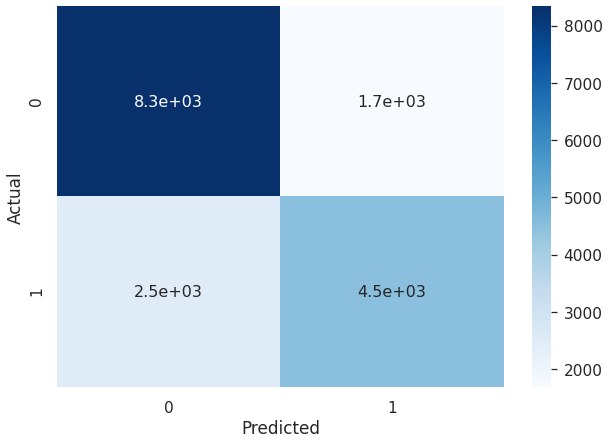

In [129]:
df_cm = pd.DataFrame(cm, columns = [0, 1], index = [0, 1])
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sns.set(font_scale=1.4)
sns.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})

In [130]:
list(test_df.columns)

['cat_age',
 'cat_bmi',
 'height',
 'weight',
 'bilirubin_apache',
 'creatinine_apache',
 'glucose_apache',
 'sodium_apache',
 'temp_apache',
 'urineoutput_apache',
 'd1_albumin_max',
 'd1_albumin_min',
 'd1_bilirubin_max',
 'd1_bilirubin_min',
 'd1_bun_max',
 'd1_bun_min',
 'd1_calcium_max',
 'd1_calcium_min',
 'd1_creatinine_max',
 'd1_creatinine_min',
 'd1_glucose_max',
 'd1_glucose_min',
 'd1_hco3_max',
 'd1_hco3_min',
 'd1_hemaglobin_max',
 'd1_hemaglobin_min',
 'd1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_inr_max',
 'd1_inr_min',
 'd1_platelets_max',
 'd1_platelets_min',
 'd1_potassium_max',
 'd1_potassium_min',
 'd1_sodium_max',
 'd1_sodium_min',
 'd1_wbc_max',
 'd1_wbc_min',
 'cirrhosis',
 'hepatic_failure',
 'ethnicity_African American',
 'ethnicity_Asian',
 'ethnicity_Caucasian',
 'ethnicity_Hispanic',
 'ethnicity_Native American',
 'ethnicity_Other',
 'ethnicity_Other/Unknown',
 'ias_Accident & Emergency',
 'ias_Floor',
 'ias_Operating Room / Recovery',
 'ias_Other Hospit

In [134]:
previsions_final = classifier_1.predict(test_df)

In [135]:
output_final = pd.DataFrame()
output_final['encounter_id'] = test_encounter_ids
output_final['diabetes_mellitus'] = previsions_final

output_final.to_csv('final_submission.csv', index = False)

In [133]:
# https://www.kaggle.com/usharengaraju/widsdatathon2021-catboost-starter
# https://www.kaggle.com/miios18/wids-2021-diabetes-prediction
# https://www.kaggle.com/celniker/wids2021-initial-eda-and-tuned-lgbm-0-86293
# https://www.kaggle.com/parulpandey/a-guide-to-handling-missing-values-in-python